# Обучение определения фейковых фактов о COVID и вакцинации

In [153]:
import math

import torch
import pandas as pd
import numpy as np

In [154]:
DEVICE = 'cpu'
if torch.backends.mps.is_available():
    DEVICE = 'mps'
if torch.cuda.is_available():
    DEVICE = 'cuda'

In [155]:
from pathlib import Path

DATA_PATH = Path('data/')
DATA_PATH.mkdir(parents=True, exist_ok=True)

DATA_CACHE = Path('data/cache_dir/')
DATA_CACHE.mkdir(parents=True, exist_ok=True)

DATA_PATH_SAVE_MODELS = Path('data/models/')
DATA_PATH_SAVE_MODELS.mkdir(parents=True, exist_ok=True)

pd.set_option('display.max_colwidth', 500) 

In [156]:
# MODEL_NAME = "covid_vaccine_fake_model"
TEST_DF_NAME = "facebook_data_to_complate.xlsx"

MODEL_NAME = "roberta-base"
# TEST_DF_NAME = "facebook_data_to_model.xlsx"

MAX_LENGTH = 128
BATCH_SIZE = 64

# Датасет

In [157]:
data_df = pd.read_excel(DATA_PATH / TEST_DF_NAME)
data_df = data_df.dropna(how='all')
data_df = data_df.sample(1000)
data_df['text'] = data_df['text'].astype(str)
data_df = data_df.dropna(subset='predict_1')

# Добавляем колонку с обрезанным текстом (200 символов)
data_df["truncated_text"] = data_df["text"].apply(lambda x: x[:200] + "..." if len(x) > 200 else x)

# Добавляем колонку id (используем индекс датафрейма)
data_df["id"] = data_df.index

In [158]:
data_df.head(5)

,Group Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,...,Sponsor Category,Overperforming Score (weighted — Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x ),text,link_text,predict_1,probability_1,predict_2,probability_2,truncated_text,id
2428,COVID19: Real Talk from Health Care Workers around the Globe,NaN,1073058046385811,none,NaN,NaN,NaN,77703.0,NaN,2020-04-03 10:56:11 EDT,...,NaN,2.74,"There have been a lot of posts on here where people are coming together to support each other and that is awesome. I appreciate that more than you know. There have also been people attacking each other on here, making assumptions about each other and being condescending. Please remember that we are all scared, we are all stressed and we could all use a hug that many of us simply can't get. With so many higher ups not having our backs, we need to have each other's back. Please don't start mak...",NaN,Real,"[0.9080904126167297, 0.09190959483385086]",NaN,NaN,There have been a lot of posts on here where people are coming together to support each other and that is awesome. I appreciate that more than you know. There have also been people attacking each othe...,2428
4923,Health Care Assistants HCA / Nurses / Support Workers - JOBS (UK),NaN,629521900975276,none,NaN,NaN,NaN,NaN,NaN,2022-04-05 16:46:19 EDT,...,NaN,1.26,"UK only, no sponsorship available.",Live-In Care Assistant - £700 Per Week Are you looking for a new start? A fresh challenge with a genuine opportunity to make a difference within your local community? Make the change and start a career in Health & Social Care. No experience necessary as full training is given. The live-in care worker is not on duty 24 hours a day and is....,Real,"[0.7518462538719177, 0.24815374612808228]",Real,"[0.9951117634773254, 0.004888220690190792]","UK only, no sponsorship available.",4923
5493,Health Care Assistants HCA / Nurses / Support Workers - JOBS (UK),NaN,629521900975276,none,NaN,NaN,NaN,18464.0,NaN,2022-05-31 03:27:44 EDT,...,NaN,1.11,✴ New UK Work Visa Announcement ✴ ✅ Check If You Qualify 🥳🥳🥳🥳,"This is a re-share of a post The UK Announces A New Visa!🥳 All Graduates from The World's Top 50 Universities✅\nCan Now Move To The UK, Without A Sponsorship Job😍",Real,"[0.9983945488929749, 0.0016054598381742835]",Fake,"[0.0010479929624125361, 0.9989520311355591]",✴ New UK Work Visa Announcement ✴ ✅ Check If You Qualify 🥳🥳🥳🥳,5493
2385,Covid 19 - Newmill Community Support,NaN,1556784341144788,none,NaN,NaN,NaN,NaN,NaN,2020-12-06 14:07:27 EST,...,NaN,2.79,A huge thanks to Duncan and Cameron McIntosh braving the elements today to make sure the lights went on in Newmill tonight. Thanks also to Charles Davidson who once again provided and drove his machine making sure it was all done safely. Thanks also to Barry Shepherd who has spent weeks repairing and getting the lights ready for today. I must also thank Dod Petrie for all his help Hope the bairns like them 🎄🤶🎅🏻☃️✨,Photos from Rhona Patterson's post,Real,"[0.9969269633293152, 0.003073072759434581]",Fake,"[0.03579077497124672, 0.964209258556366]",A huge thanks to Duncan and Cameron McIntosh braving the elements today to make sure the lights went on in Newmill tonight. Thanks also to Charles Davidson who once again provided and drove his machin...,2385
3722,Health Care Assistants HCA / Nurses / Support Workers - JOBS (UK),NaN,629521900975276,none,NaN,NaN,NaN,34390.0,NaN,2022-10-17 04:56:10 EDT,...,NaN,1.75,"Do you have desire to work in NHS Hospitals? We are HIRING UK-Based HCAs, RGNs, and RMNs for loads of available shifts in the top NHS Hospitals. Benefits include: >Excellent hourly pay rates >Career development >24/7 dedicated team of consultants to help you > Suitable shifts (Early, Lates, Nights or Long days) RMNs/RGNs £22 - £35 HCAs £12- £17. 5 To register kindly email us your updated CV to wairu.compliance@delta-nursing.co.uk Let'

In [159]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 713 entries, 2428 to 476
Data columns (total 48 columns):
 #   Column                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                              --------------  -----  
 0   Group Name                                                                                                          713 non-null    object 
 1   User Name                                                                                                           0 non-null      float64
 2   Facebook Id                                                                                                         713 non-null    int64  
 3   Page Category                                                                                                       713 non-null    object 
 4   Page Admin Top Country

In [160]:
idx2label = {
    0: "Real",
    1: "Fake",
    2: "Comments"
}

# Модель

In [161]:
from transformers import RobertaTokenizer

tokenizer: RobertaTokenizer = RobertaTokenizer.from_pretrained(MODEL_NAME, cache_dir=DATA_CACHE)

d:\Projects\env_ml\.venv\Lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [162]:
from transformers import RobertaModel

model = RobertaModel.from_pretrained(
    MODEL_NAME, cache_dir=DATA_CACHE)

model.to(DEVICE)
model.eval()
DEVICE

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


'cpu'

## Получение эмбедингов

In [163]:
import torch
from tqdm import tqdm


def add_text_embeddings(
    df, text_column="text", embedding_column="embedding", strategy="mean", 
    max_length=128, batch_size=64
):
    """
    Добавляет эмбеддинги в DataFrame.

    Параметры:
    - df: входной DataFrame с текстами.
    - text_column: название колонки с текстом.
    - embedding_column: название колонки для эмбеддингов.
    - strategy: метод усреднения токенов ("mean", "cls", "max", "sum").
    - max_length: максимальная длина токенов.
    - batch_size: размер батча для обработки.

    Возвращает:
    - DataFrame с добавленной колонкой эмбеддингов.
    """
    texts = df[text_column].tolist()
    embeddings = []

    for i in tqdm(range(0, len(texts), batch_size), desc="Processing batches"):
        batch_texts = texts[i:i+batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, 
                           max_length=max_length, return_tensors="pt")

        with torch.no_grad():
            outputs = model(**inputs)

        # Получаем эмбеддинги всех токенов
        hidden_states = outputs.last_hidden_state  # [batch_size, seq_length, hidden_size]

        # Выбор стратегии усреднения
        if strategy == "mean":
            batch_embeddings = hidden_states.mean(dim=1)  # Среднее по всем токенам
        elif strategy == "cls":
            batch_embeddings = hidden_states[:, 0, :]  # Только CLS-токен
        elif strategy == "max":
            batch_embeddings, _ = hidden_states.max(dim=1)  # Максимальное значение по токенам
        elif strategy == "sum":
            batch_embeddings = hidden_states.sum(dim=1)  # Сумма всех токенов
        else:
            raise ValueError("Некорректная стратегия. Выберите из ['mean', 'cls', 'max', 'sum'].")

        # Преобразуем тензоры в списки для хранения в DataFrame
        embeddings.extend(batch_embeddings.tolist())

    # Добавляем колонку с эмбеддингами
    df[embedding_column] = embeddings
    return df

In [164]:
data_df = add_text_embeddings(data_df, text_column="text", embedding_column="embedding", strategy="cls")

Processing batches: 100%|██████████| 12/12 [01:02<00:00,  5.21s/it]


In [165]:
data_df.to_excel(DATA_PATH / 'facebook_data_embedding.xlsx', index=False)

In [166]:
# data_df = pd.read_excel(DATA_PATH / 'facebook_data_embedding.xlsx')

In [167]:
data_df.sample(1)

,Group Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,...,Overperforming Score (weighted — Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x ),text,link_text,predict_1,probability_1,predict_2,probability_2,truncated_text,id,embedding
5406,COVID19: Real Talk from Health Care Workers around the Globe,NaN,1073058046385811,none,NaN,NaN,NaN,107704.0,NaN,2020-12-21 19:49:50 EST,...,1.14,"Those of you who HAVE received the vaccine, are you using the V-SAFE app provided by the CDC?",NaN,Fake,"[0.04636722058057785, 0.9536327719688416]",NaN,NaN,"Those of you who HAVE received the vaccine, are you using the V-SAFE app provided by the CDC?",5406,"[-0.051865026354789734, 0.07076473534107208, -0.01921284943819046, -0.10226951539516449, 0.03133281320333481, -0.09522620588541031, -0.031193628907203674, 0.038041986525058746, 0.05523155629634857, -0.049766965210437775, -0.024563021957874298, 0.09005498886108398, 0.020299794152379036, -0.05254247784614563, 0.04807556793093681, 0.004425480961799622, -0.06398453563451767, -0.01754528284072876, 0.0038999542593955994, 0.005454562604427338, -0.13189324736595154, 0.0289524644613266, -0.0692735388..."


## Уменьшение размерности

In [168]:
import matplotlib.pyplot as plt


def get_cmap(n, name='hsv'):
    """
    Returns a function that maps each index in 0, 1, ..., n-1 to a distinct RGB color;
    the keyword argument name must be a standard mpl colormap name.
    """
    return plt.cm.get_cmap(name, n)


In [169]:
import sys
import numpy as np
from itertools import islice
if sys.version_info >= (3, 12):
    from itertools import batched
else:
    try:
        from more_itertools import batched
    except ImportError:
        def batched(iterable, chunk_size):
            iterator = iter(iterable)
            while chunk := tuple(islice(iterator, chunk_size)):
                yield chunk
                
                
from torch.utils.data import DataLoader

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

def plot(data, n_components=2, method='PCA', alpha=0.5, targets_idxs2labels=None):
    if targets_idxs2labels is None:
        targets_idxs2labels = {}

    markers = ['x', '+', 'o', 'X', '1', 'p', '*', 'P', 'H', 'D', '2']
    markers_cnt = len(markers)
    x = []

    show_targets = len(data[0]) > 1
    if show_targets:
        y = []
        [(x.append(i), y.append(j.cpu().numpy().item())) for i, j in DataLoader(data)]

        unq_targets_idxs = set()
        [unq_targets_idxs.add(x) for x in y]
        targets_cnt = len(unq_targets_idxs)

        y = np.array(y)
    else:
        [x.append(i[0].view(-1).cpu().numpy()) for i in DataLoader(data)]

    x = np.array(x)

    if method != 'PCA':
        method = 'TSNE'
        x = np.array(TSNE(n_components=n_components).fit_transform(x))
    else:
        x = np.array(PCA(n_components=n_components).fit_transform(x))

    print(f"Method: {method}, {n_components}D")

    fig = plt.figure(1, figsize=(10, 10))
    fig.clf()

    if n_components == 2:
        ax = plt.subplot()
        plt.axis('off')
    else:
        ax = plt.subplot(111, projection='3d')

    if not show_targets:
        ax.scatter(*[x[:, i] for i in range(n_components)], s=20, alpha=alpha)
    else:
        cmap = get_cmap(targets_cnt, name='hsv')

        groups = {x: [] for x in unq_targets_idxs}
        [groups[i].append(j) for i, j in zip(y, x)]

        for i in unq_targets_idxs:
            groups[i] = [np.array(batch) for batch in batched(groups[i], 100)]

        ncol = math.ceil(math.log(targets_cnt) + 1)

        make_label = True
        while groups:
            for target_idx, batched_groups in list(groups.items()):
                try:
                    group = batched_groups.pop()
                except IndexError:
                    del groups[target_idx]
                else:
                    if make_label:
                        label = targets_idxs2labels.get(target_idx, None)
                        if label is None:
                            label = f"[{target_idx}]"
                        else:
                            max_label_length = 100 // ncol
                            if len(label) > max_label_length:
                                label = label[:max_label_length] + '…'
                            label = f"{label} [{target_idx}]"
                    else:
                        label = None
                    ax.scatter(*[group[:, i] for i in range(n_components)],
                               marker=markers[target_idx % markers_cnt],
                               label=label,
                               s=20, color=cmap(target_idx), alpha=alpha
                               )
            make_label = False

        plt.legend(loc='upper left', numpoints=1, ncol=ncol,
                   fontsize=8, bbox_to_anchor=(0, 0))

    plt.show()

In [170]:
embeddings = np.array(data_df["embedding"].tolist())

In [171]:

label2idx = {v: k for k, v in idx2label.items()}
label2idx

{'Real': 0, 'Fake': 1, 'Comments': 2}

In [172]:
# data_df

In [173]:
pairs = tuple(
    (emb, label2idx[trg])
    for emb, trg in zip(embeddings, data_df["predict_1"])
)

In [174]:
[(i, j)for i, j in DataLoader(pairs)]


[(tensor([[-3.7382e-02,  9.2003e-02,  1.7489e-02, -1.3283e-01,  8.6121e-02,
           -1.0022e-01,  1.9892e-04,  1.9074e-02,  4.6970e-02, -6.2394e-02,
            3.3656e-03,  2.1516e-02,  2.7198e-02, -4.7087e-02,  3.7894e-02,
           -1.1320e-02, -6.6993e-02,  2.2868e-03,  2.3977e-02, -3.8909e-02,
           -1.0828e-01,  6.7206e-02, -1.9706e-02,  1.0646e-01,  3.6963e-02,
            6.1890e-02,  7.0853e-02,  9.4215e-02, -3.2413e-02, -2.0712e-02,
           -2.4091e-03, -2.4398e-02,  7.6583e-02, -8.9866e-04,  1.7590e-02,
            6.4107e-02,  5.3087e-02,  8.5801e-04, -4.4868e-02,  1.8529e-02,
           -3.0481e-02,  1.1386e-01,  9.2015e-04, -1.5642e-02,  6.6768e-02,
           -6.3000e-03, -3.6215e-02,  8.7102e-03,  2.1712e-03, -1.7982e-02,
           -4.5115e-02,  5.8747e-02, -2.9911e-02,  3.8860e-02, -1.3864e-01,
            1.9038e-02,  7.4559e-03,  9.0080e-02,  8.1092e-02, -4.7114e-02,
            1.7913e-03, -1.3583e-01, -5.4009e-02, -1.0550e-02,  3.2063e-02,
           -

In [178]:
# plot(pairs, targets_idxs2labels=idx2label)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (713, 2) + inhomogeneous part.

In [185]:
import matplotlib.pyplot as plt


def get_cmap(n, name='hsv'):
    """
    Returns a function that maps each index in 0, 1, ..., n-1 to a distinct RGB color;
    the keyword argument name must be a standard mpl colormap name.
    """
    return plt.cm.get_cmap(name, n)


In [191]:
import math
import numpy as np
import torch
import matplotlib.pyplot as plt

from torch.utils.data import DataLoader, TensorDataset
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Если sys.version_info < (3, 12) и нет 'itertools.batched', используем свою реализацию:
from itertools import islice
def batched(iterable, chunk_size):
    iterator = iter(iterable)
    while chunk := tuple(islice(iterator, chunk_size)):
        yield chunk

def plot(
    x,                  # <-- эмбеддинги (numpy-массив или список)
    y=None,             # <-- метки (numpy-массив или список) или None
    n_components=2,
    method='PCA',
    alpha=0.5,
    targets_idxs2labels=None
):
    """
    x : np.ndarray, shape = (n_samples, embedding_dim)
        Эмбеддинги.

    y : np.ndarray или list или None
        Метки классов (целые числа, например) или None, если меток нет.

    n_components : int
        Размерность для отображения (2 или 3).

    method : str, 'PCA' или 'TSNE'
        Способ снижения размерности для визуализации.

    alpha : float
        Прозрачность точек на графике.

    targets_idxs2labels : dict или None
        Словарь для отображения меток (чисел) в человекочитаемые названия.
        Например, {0: "cat", 1: "dog"} и т.п.
    """
    if targets_idxs2labels is None:
        targets_idxs2labels = {}

    # Создадим Dataset и DataLoader: если y != None, то будет (x, y), иначе (x)
    if y is not None:
        dataset = TensorDataset(torch.from_numpy(np.array(x, dtype=np.float32)),
                                torch.from_numpy(np.array(y)))
        show_targets = True
    else:
        dataset = TensorDataset(torch.from_numpy(np.array(x, dtype=np.float32)))
        show_targets = False

    loader = DataLoader(dataset, batch_size=1)

    # Собираем данные в списки x_data и (если есть метки) y_data
    x_data = []
    y_data = []
    if show_targets:
        for emb, label in loader:
            # emb.shape будет (1, embedding_dim), label.shape будет (1,)
            x_data.append(emb.view(-1).cpu().numpy()) 
            # Предположим, что label — это одна целая метка
            y_data.append(label.item())
    else:
        for (emb,) in loader:
            x_data.append(emb.view(-1).cpu().numpy())

    # Преобразуем список в numpy-массив
    x_data = np.array(x_data)

    # Выбираем метод снижения размерности: TSNE или PCA
    if method != 'PCA':
        method = 'TSNE'
        x_data = TSNE(n_components=n_components).fit_transform(x_data)
    else:
        x_data = PCA(n_components=n_components).fit_transform(x_data)

    print(f"Method: {method}, {n_components}D")

    # Настраиваем фигуру
    fig = plt.figure(figsize=(10, 10))
    fig.clf()
    if n_components == 2:
        ax = fig.add_subplot()
        plt.axis('off')
    else:
        ax = fig.add_subplot(111, projection='3d')

    # Если меток нет, просто рисуем рассеяние
    if not show_targets:
        if n_components == 2:
            ax.scatter(x_data[:, 0], x_data[:, 1], s=20, alpha=alpha)
        else:
            ax.scatter(x_data[:, 0], x_data[:, 1], x_data[:, 2], s=20, alpha=alpha)
    else:
        # Если метки есть, делаем групповую отрисовку
        markers = ['x', 'o','1', 'p', '*', 'P', 'H', 'D', '2']
        markers_cnt = len(markers)

        # Функция cmap, определите сами или используйте готовый:
        # from matplotlib.cm import get_cmap
        
        unq_targets_idxs = sorted(set(y_data))
        targets_cnt = len(unq_targets_idxs)
        cmap = lambda i: ['red', 'green'][i % 2]

        # Готовим словарь: метка -> список координат
        groups = {t: [] for t in unq_targets_idxs}
        for coords, label in zip(x_data, y_data):
            groups[label].append(coords)

        # Для оптимизации отрисовки -- бьём на батчи по 100 точек
        for label in unq_targets_idxs:
            groups[label] = [np.array(batch) for batch in batched(groups[label], 100)]

        # Рисуем по батчам, но легенду выводим только один раз
        import math
        make_label = True
        ncol = max(1, math.ceil(math.log(targets_cnt, 2)))  # Примерно

        while groups:
            for label_val, batched_groups in list(groups.items()):
                try:
                    group = batched_groups.pop()
                except IndexError:
                    del groups[label_val]
                else:
                    if make_label:
                        # Если в словаре targets_idxs2labels нет метки,
                        # показываем её как число
                        label_txt = targets_idxs2labels.get(label_val, str(label_val))
                    else:
                        label_txt = None

                    if n_components == 2:
                        ax.scatter(
                            group[:, 0],
                            group[:, 1],
                            marker=markers[label_val % markers_cnt],
                            label=label_txt,
                            s=20, color=cmap(label_val), alpha=alpha
                        )
                    else:
                        ax.scatter(
                            group[:, 0],
                            group[:, 1],
                            group[:, 2],
                            marker=markers[label_val % markers_cnt],
                            label=label_txt,
                            s=20, color=cmap(label_val), alpha=alpha
                        )

            make_label = False

        plt.legend(loc='upper left', numpoints=1, ncol=ncol,
                   fontsize=8, bbox_to_anchor=(0, 0))

    plt.show()


Method: PCA, 2D


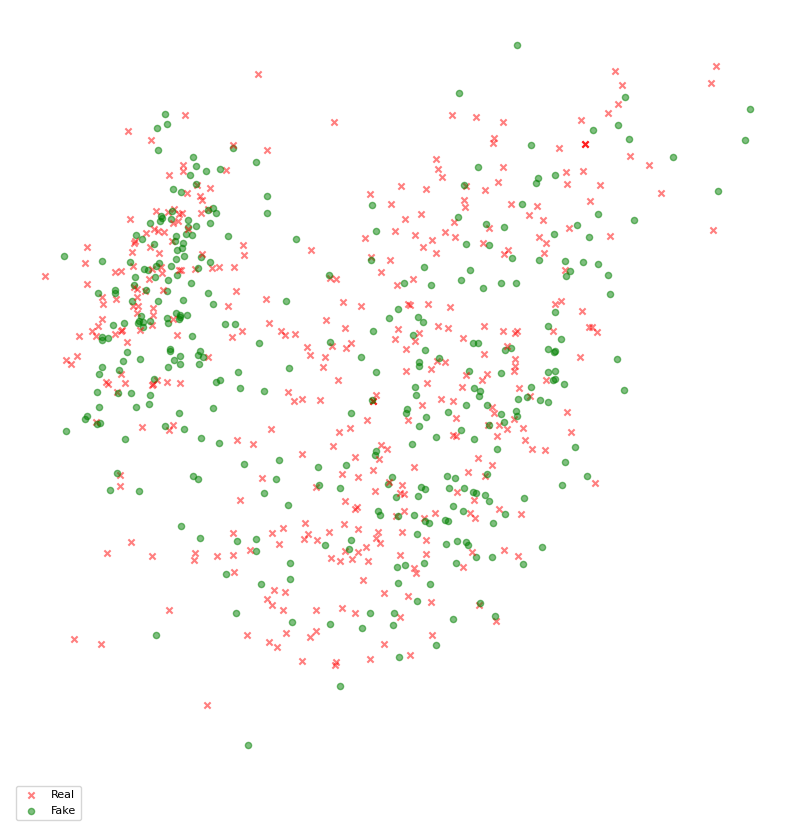

In [192]:
embeddings = np.array(data_df["embedding"].tolist())
targets = data_df['predict_1'].apply(lambda predict: label2idx[predict]).tolist()



plot(x=embeddings, y=targets, targets_idxs2labels=idx2label)

Method: TSNE, 2D


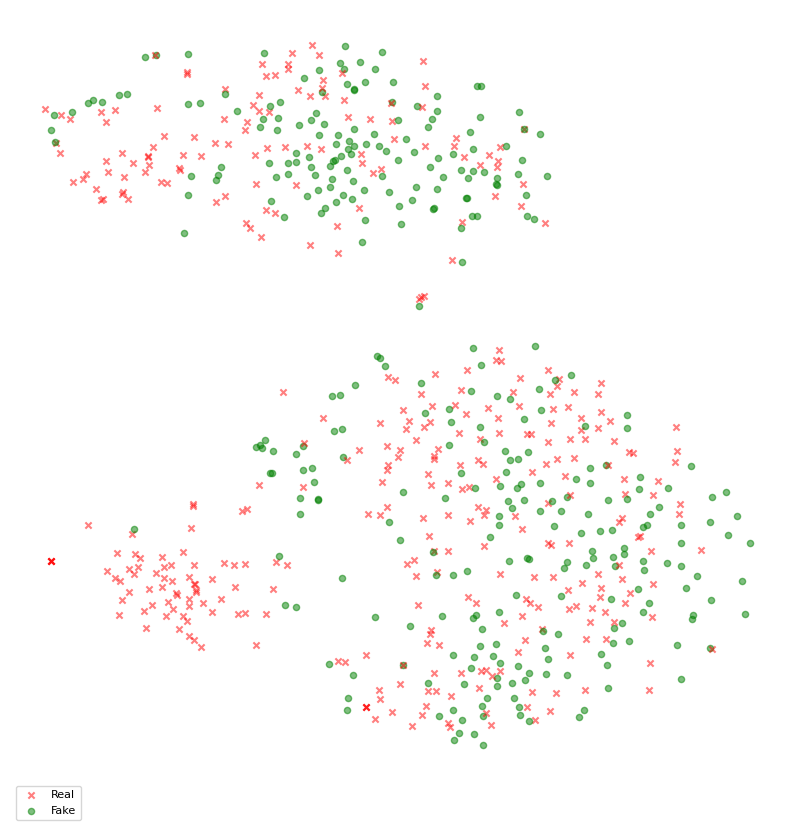

In [193]:
plot(x=embeddings, y=targets, method='TSNE', targets_idxs2labels=idx2label)

### PCA 2D

In [260]:
import pandas as pd
import numpy as np

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE



if isinstance(data_df["embedding"].iloc[0], str):
    data_df["embedding"] = data_df["embedding"].apply(eval)

embeddings = np.array(data_df["embedding"].tolist())

n_components = 2  # Уменьшаем до 2D для визуализации
pca = TSNE(n_components=n_components)
reduced_embeddings = pca.fit_transform(embeddings)

data_df["pca_1"] = reduced_embeddings[:, 0]
data_df["pca_2"] = reduced_embeddings[:, 1]

In [261]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=data_df["pca_1"], 
    y=data_df["pca_2"], 
    mode="markers",
    marker=dict(size=8, opacity=0.7),
    customdata=data_df[["truncated_text", "predict_1", "id"]],  # Передаем обрезанный text, predict_1 и id
    hovertemplate="<b>Text:</b> %{customdata[0]}<br>"  # Отображаем обрезанный text
                  "<b>Predict:</b> %{customdata[1]}<br>"  # Отображаем predict_1
                  "<b>Id:</b> %{customdata[2]}"  # Теперь ID будет на новой строке
))

fig.update_layout(
    title="PCA с интерактивными точками",
    xaxis_title="PCA 1",
    yaxis_title="PCA 2",
    template="plotly_white",
    width=1800,  # Увеличенный размер для удобства
    height=1200,
)

fig.show()


## Кластеризация

In [262]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Диапазон количества кластеров для тестирования
cluster_range = range(2, 15)
inertia_values = []
silhouette_scores = []

# Тестируем K-Means с разным числом кластеров
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(data_df[["pca_1", "pca_2"]])
    
    inertia_values.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(data_df[["pca_1", "pca_2"]], cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Определяем оптимальное количество кластеров по максимальному силуэтному коэффициенту
optimal_k = cluster_range[np.argmax(silhouette_scores)]

# Применяем K-Means с оптимальным количеством кластеров
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
data_df["cluster"] = kmeans.fit_predict(data_df[["pca_1", "pca_2"]])

In [263]:
import plotly.graph_objects as go

# Создаем интерактивный график для метода локтя (Elbow Method)
fig = go.Figure()

# Добавляем линию инерции (метод локтя)
fig.add_trace(go.Scatter(
    x=list(cluster_range),
    y=inertia_values,
    mode="lines+markers",
    name="Инерция (Elbow Method)",
    marker=dict(size=8)
))

fig.update_layout(
    title="Метод локтя: Оптимальное количество кластеров",
    xaxis_title="Количество кластеров (k)",
    yaxis_title="Инерция",
    template="plotly_white"
)

fig.show()

# Создаем интерактивный график для коэффициента силуэта (Silhouette Score)
fig_silhouette = go.Figure()

fig_silhouette.add_trace(go.Scatter(
    x=list(cluster_range),
    y=silhouette_scores,
    mode="lines+markers",
    name="Коэффициент силуэта",
    marker=dict(size=8, color="red")
))

fig_silhouette.update_layout(
    title="Оптимальное количество кластеров (Silhouette Score)",
    xaxis_title="Количество кластеров (k)",
    yaxis_title="Коэффициент силуэта",
    template="plotly_white"
)

fig_silhouette.show()


In [264]:
import plotly.express as px
import plotly.graph_objects as go
from ipywidgets import interact, IntSlider
from sklearn.cluster import KMeans

# Функция для кластеризации и визуализации с выбором k
def visualize_clusters(k):
    # Применяем K-Means с выбранным количеством кластеров
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    data_df["cluster"] = kmeans.fit_predict(data_df[["pca_1", "pca_2"]])
    
    # Получаем центры кластеров
    centers = kmeans.cluster_centers_
    
    # Создаем интерактивный scatter plot с кластерами
    fig = px.scatter(
        data_df, x="pca_1", y="pca_2", 
        color=data_df["cluster"].astype(str),
        title=f"K-Means Кластеризация (k={k})",
        labels={"pca_1": "PCA 1", "pca_2": "PCA 2", "color": "Кластер"},
        hover_data=["id", "truncated_text", "predict_1"]
    )
    
    # Добавляем центры кластеров на график
    fig.add_trace(go.Scatter(
        x=centers[:, 0],
        y=centers[:, 1],
        mode="markers",
        marker=dict(size=12, color="black", symbol="x"),
        name="Центры кластеров"
    ))

    # **Переносим изменение размера перед fig.show()**
    fig.update_layout(
        width=1500,
        height=1200,
        template="plotly_white",  # Улучшенный стиль
        xaxis=dict(showgrid=True, gridwidth=0.5, gridcolor="lightgray"),  # Мелкая сетка
        yaxis=dict(showgrid=True, gridwidth=0.5, gridcolor="lightgray")
    )

    fig.show()

# Создаем слайдер для выбора количества кластеров
interact(visualize_clusters, k=IntSlider(min=2, max=15, step=1, value=5, description="Количество кластеров"))


interactive(children=(IntSlider(value=5, description='Количество кластеров', max=15, min=2), Output()), _dom_c…

<function __main__.visualize_clusters(k)>

### PCA 3D

In [265]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA


if isinstance(data_df["embedding"].iloc[0], str):
    data_df["embedding"] = data_df["embedding"].apply(eval)

embeddings = np.array(data_df["embedding"].tolist())

n_components = 3
pca = PCA(n_components=n_components)
reduced_embeddings = pca.fit_transform(embeddings)

data_df["pca_1"] = reduced_embeddings[:, 0]
data_df["pca_2"] = reduced_embeddings[:, 1]
data_df["pca_3"] = reduced_embeddings[:, 2]

In [266]:
import plotly.graph_objects as go

# Создаем 3D scatter plot
fig = go.Figure()

fig.add_trace(go.Scatter3d(
    x=data_df["pca_1"], 
    y=data_df["pca_2"], 
    z=data_df["pca_3"],
    mode="markers",
    marker=dict(size=6, opacity=0.7),
    customdata=data_df[["truncated_text", "predict_1", "id"]],  # Передаем обрезанный text, predict_1 и id
    hovertemplate="<b>Text:</b> %{customdata[0]}<br>"  # Отображаем обрезанный text
                  "<b>Predict:</b> %{customdata[1]}<br>"  # Отображаем predict_1
                  "<b>Id:</b> %{customdata[2]}"  # Теперь ID будет на новой строке
))

fig.update_layout(
    title="3D PCA с интерактивными точками",
    scene=dict(
        xaxis_title="PCA 1",
        yaxis_title="PCA 2",
        zaxis_title="PCA 3"
    ),
    template="plotly_white"
)

fig.update_layout(
    width=1500,
    height=1000,
)

fig.show()


### K-mean

In [267]:
# Адаптация кода под 3D кластеризацию

import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Диапазон количества кластеров для тестирования
cluster_range = range(2, 15)
inertia_values = []
silhouette_scores = []

# Тестируем K-Means с разным числом кластеров на 3D PCA
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(data_df[["pca_1", "pca_2", "pca_3"]])
    
    inertia_values.append(kmeans.inertia_)
    
    # Проверяем, достаточно ли данных для расчета силуэтного коэффициента
    if len(set(cluster_labels)) > 1:  
        silhouette_avg = silhouette_score(data_df[["pca_1", "pca_2", "pca_3"]], cluster_labels)
        silhouette_scores.append(silhouette_avg)
    else:
        silhouette_scores.append(-1)

# Определяем оптимальное количество кластеров по максимальному силуэтному коэффициенту
optimal_k = cluster_range[np.argmax(silhouette_scores)]

# Применяем K-Means с оптимальным количеством кластеров
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
data_df["cluster"] = kmeans.fit_predict(data_df[["pca_1", "pca_2", "pca_3"]])


In [268]:
import plotly.express as px
import plotly.graph_objects as go
from ipywidgets import interact, IntSlider
from sklearn.cluster import KMeans

# Функция для кластеризации и визуализации 3D с выбором k
def visualize_clusters_3d(k):
    # Применяем K-Means с выбранным количеством кластеров
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    data_df["cluster"] = kmeans.fit_predict(data_df[["pca_1", "pca_2", "pca_3"]])
    
    # Получаем центры кластеров
    centers = kmeans.cluster_centers_
    
    # Создаем интерактивный 3D scatter plot с кластерами
    fig = px.scatter_3d(
        data_df, x="pca_1", y="pca_2", z="pca_3",
        color=data_df["cluster"].astype(str),
        title=f"K-Means 3D Кластеризация (k={k})",
        labels={"pca_1": "PCA 1", "pca_2": "PCA 2", "pca_3": "PCA 3", "color": "Кластер"},
        hover_data=["id", "truncated_text", "predict_1"]
    )
    
    # Добавляем центры кластеров на график
    fig.add_trace(go.Scatter3d(
        x=centers[:, 0],
        y=centers[:, 1],
        z=centers[:, 2],
        mode="markers",
        marker=dict(size=4, color="black", symbol="x"),
        name="Центры кластеров"
    ))

    # **Исправлено: обновляем стиль перед show()**
    fig.update_layout(
        width=1500,
        height=1200,
        template="plotly_white",  # Улучшенный стиль
        scene=dict(
            xaxis=dict(showgrid=True, gridwidth=0.5, gridcolor="lightgray"),
            yaxis=dict(showgrid=True, gridwidth=0.5, gridcolor="lightgray"),
            zaxis=dict(showgrid=True, gridwidth=0.5, gridcolor="lightgray")
        )
    )

    fig.show()

# Создаем слайдер для выбора количества кластеров
interact(visualize_clusters_3d, k=IntSlider(min=2, max=15, step=1, value=5, description="Количество кластеров"))


interactive(children=(IntSlider(value=5, description='Количество кластеров', max=15, min=2), Output()), _dom_c…

<function __main__.visualize_clusters_3d(k)>